In [1]:
import sys, os
sys.path.append('../src')

%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from tqdm import tqdm

pd.set_option('display.width', 160)
plt.rcParams['figure.dpi'] = 110

In [2]:
import plotting as pl
import tools.evaluation as ev
from tools.dataset import load_well
from tools.spatial import PYRAMID_SCALES
from models import recipe
from models.graph import border_mask
from tools.spatial import add_mask_pyramid, add_intensity_pyramid
from tools.morphology import indices_to_mask

In [3]:
PRIMARY_WELL = 'W9_pattern1_Sox17_Brachyury'
RESULTS = '/Users/allywang/Desktop/work/F2026/OptoBMP/results/figures'
FIG_DIR = f'{RESULTS}/{PRIMARY_WELL}'

EPOCHS = 2500
PATIENCE = 400 
# EPOCHS = 10
# PATIENCE = 50

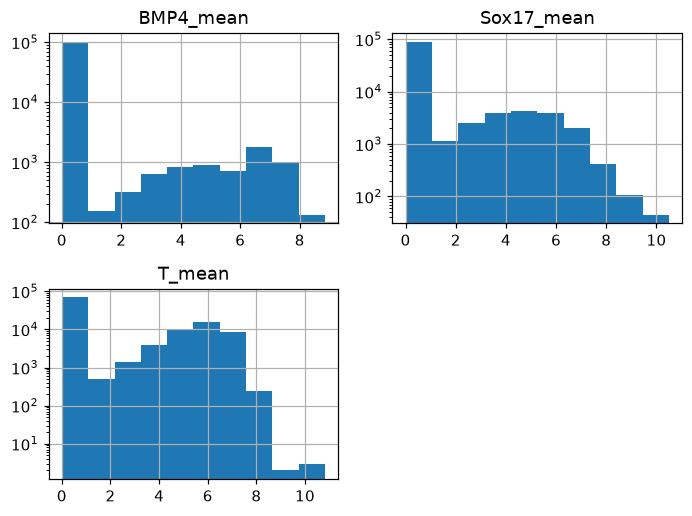

In [4]:
df = load_well(PRIMARY_WELL)
centroids = df[['centroid_y', 'centroid_x']].to_numpy(np.float32)

IF_BACKGROUNDS = df[['Sox17_mean', 'T_mean', 'BMP4_mean']].mean().to_dict()
BACKGROUNDS = recipe.normalize(df, ['BMP4_mean', 'Sox17_mean', 'T_mean'], backgrounds=IF_BACKGROUNDS)

df[['BMP4_mean', 'Sox17_mean', 'T_mean']].hist(log=True)
plt.tight_layout()

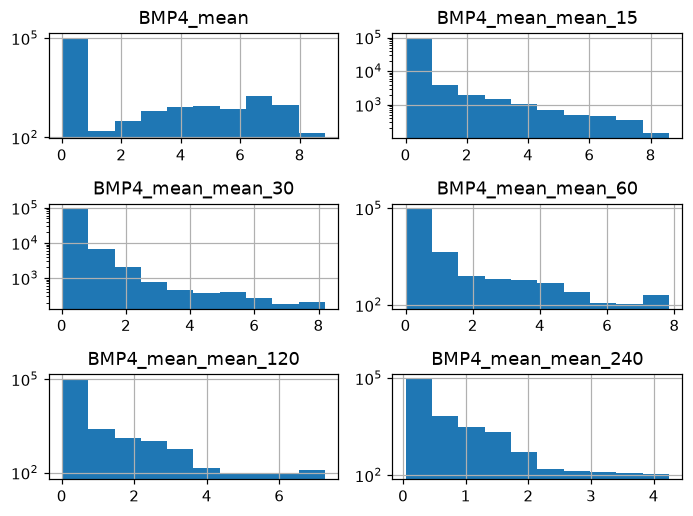

In [5]:
X_INTENSITY = recipe.intensity_features(df, 'BMP4_mean', max_sigma=recipe.MAX_SIGMA)
_ = df[X_INTENSITY].hist(log=True)
plt.tight_layout()

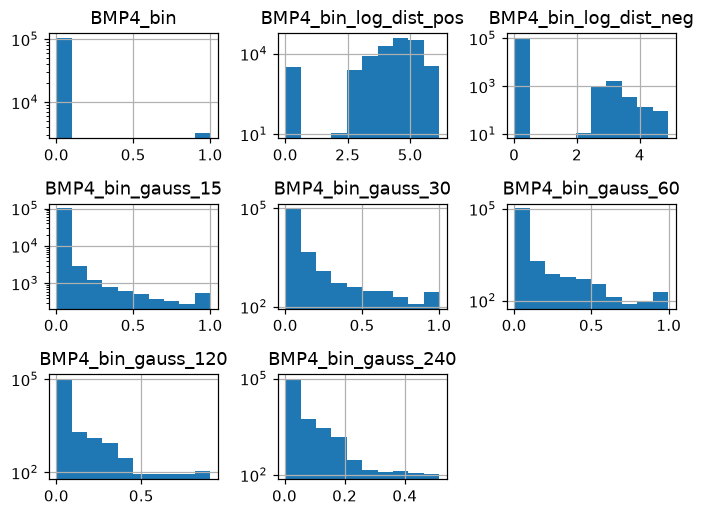

In [6]:
X_MASK = recipe.mask_features(df, 'BMP4_bin', max_sigma=recipe.MAX_SIGMA, geometry=True)
_ = df[X_MASK].hist(log=True)
plt.tight_layout()

In [7]:
shape = (int(centroids[:,0].max())+2, int(centroids[:,1].max())+2)
valid = np.where(~border_mask(centroids, shape, recipe.RADIUS))[0]

SPLITS = {
    'random':  tuple(valid[i] for i in ev.random_split(len(valid), seed=0)),
    'blocked': tuple(valid[i] for i in ev.spatial_block_split(centroids[valid], block=800.0, seed=0)),
}
N = len(df)
MASKS = {k: tuple(indices_to_mask(i, N) for i in v) for k, v in SPLITS.items()}
for k, (tr, va, te) in SPLITS.items():
    print(f'{k:8s} train/val/test = {len(tr):,}/{len(va):,}/{len(te):,}')

random   train/val/test = 74,451/15,954/15,954
blocked  train/val/test = 75,221/16,284/14,854


### Predict from BMP4 intensities

In [8]:
fname = 'BMP4_intensities'
cols = X_INTENSITY
os.makedirs(FIG_DIR, exist_ok=True)

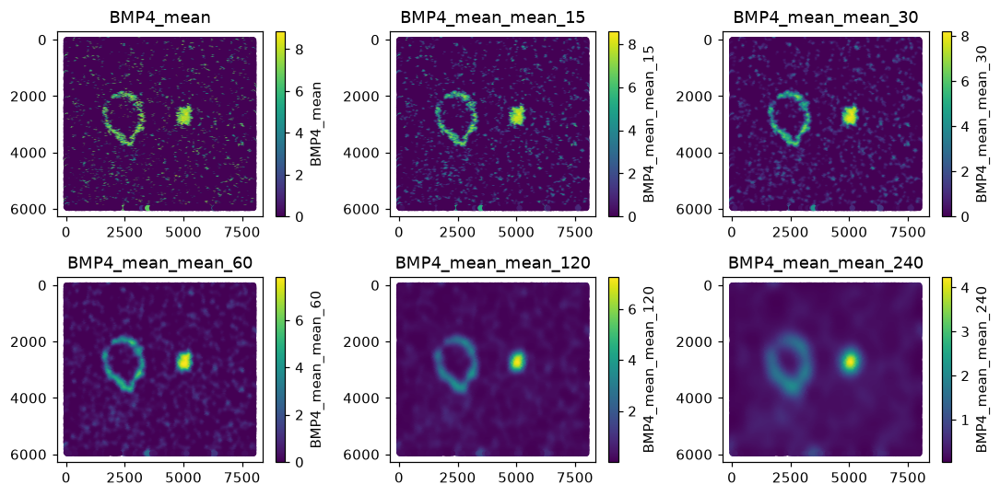

In [9]:
fig, axs = plt.subplots(2, 3, figsize=(10, 5))
axs = axs.flatten()

for ax, col in zip(axs, cols):
    sc = ax.scatter(
        df['centroid_x'],
        df['centroid_y'],
        c=df[col],
        s=10,
        alpha=1,
        cmap='viridis'
    )
    ax.invert_yaxis()
    ax.set_title(col)
    fig.colorbar(sc, ax=ax, label=col)

plt.tight_layout()
plt.savefig(f'{FIG_DIR}/X_{fname}.png')

In [10]:
rows, fitted = [], {}
for marker in ['Sox17', 'T']:

    y_col = f'{marker}_mean'
    
    for split_name, (tr, va, te) in SPLITS.items():
        trm, vam, tem = MASKS[split_name]

        model, data, log_w, history = recipe.fit(
            df, cols, y_col, trm, vam, tr, 
            epochs=EPOCHS, patience=PATIENCE, verbose=False)

        pred = recipe.predict(model, data, log_w)
        y = data['y'].numpy().ravel(); ypos = data['y_positive'].numpy().ravel()
        t = tem.numpy()
        met = ev.evaluate(y[t], pred[t], ypos[t])
        rows.append(dict(target=marker, split=split_name, features=fname, **met))
        fitted[(marker, split_name)] = dict(model=model, data=data, log_w=log_w, history=history,
                                                    pred=pred, y=y, ypos=ypos, metrics=met)
        print(f'{marker:6s} {split_name:8s} {fname:24s} '
                f'R2={met["r2"]:+.4f}  AUROC={met.get("auroc", float("nan")):.3f}')

results = pd.DataFrame(rows)
results.to_csv(f'{FIG_DIR}/models_{fname}.csv')
results.round(4)

Sox17  random   BMP4_intensities         R2=+0.1747  AUROC=0.774
Sox17  blocked  BMP4_intensities         R2=+0.0877  AUROC=0.732
T      random   BMP4_intensities         R2=+0.1784  AUROC=0.741
T      blocked  BMP4_intensities         R2=+0.0749  AUROC=0.672


,target,split,features,r2,pearson,spearman,auroc,ap,base_rate,r2_positives
0,Sox17,random,BMP4_intensities,0.1747,0.4181,0.3700,0.7740,0.4339,0.1754,-3.4742
1,Sox17,blocked,BMP4_intensities,0.0877,0.3086,0.2977,0.7321,0.3146,0.1564,-3.6967
2,T,random,BMP4_intensities,0.1784,0.4224,0.4160,0.7408,0.6043,0.3629,-5.9312
3,T,blocked,BMP4_intensities,0.0749,0.2923,0.2882,0.6725,0.4559,0.3265,-6.9102


===== Sox17 random =====


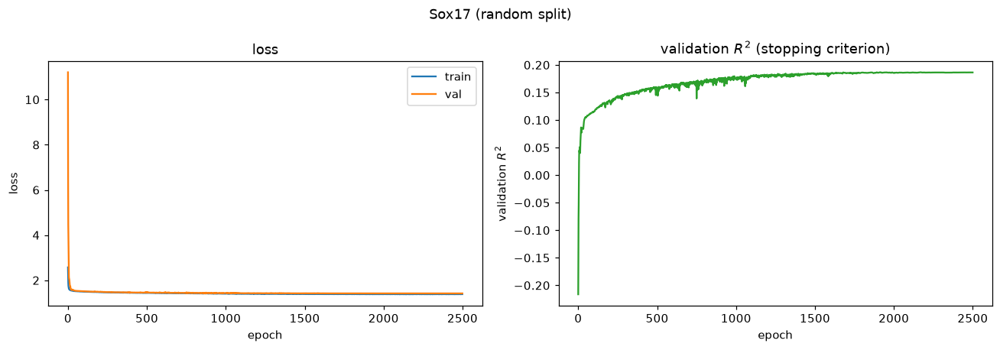

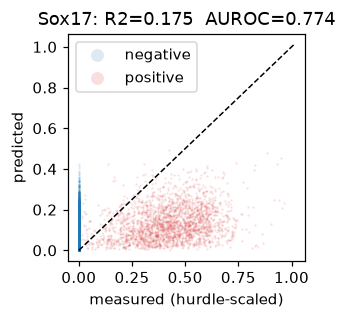

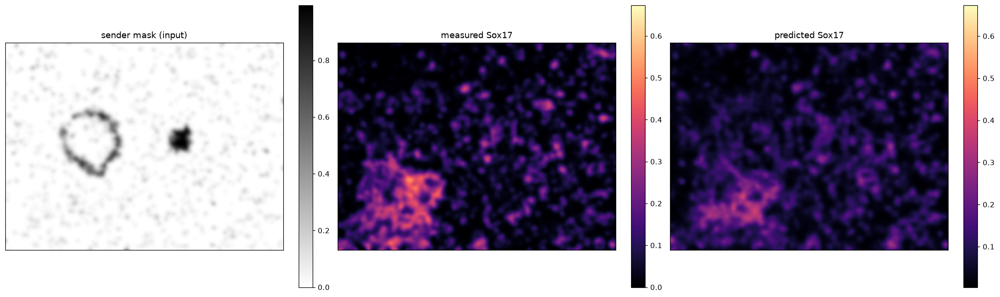

===== Sox17 blocked =====


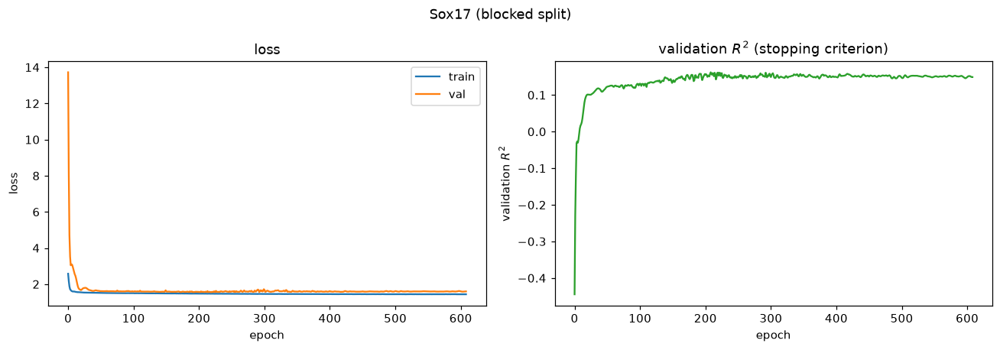

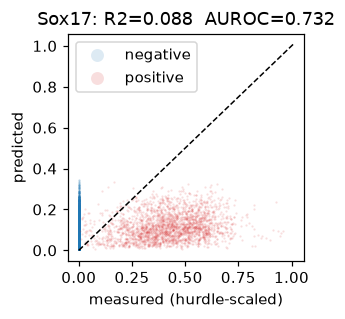

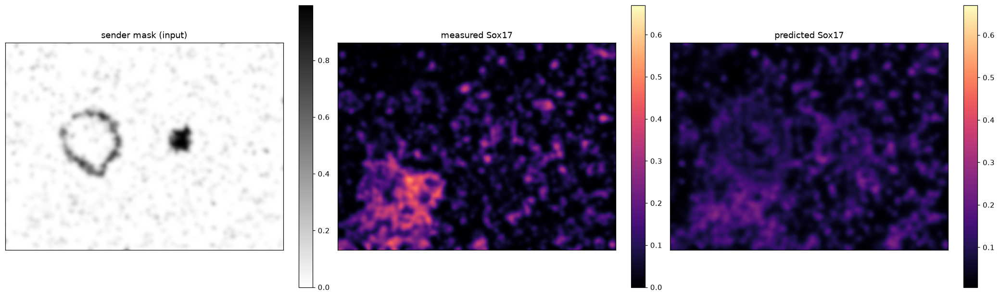

===== T random =====


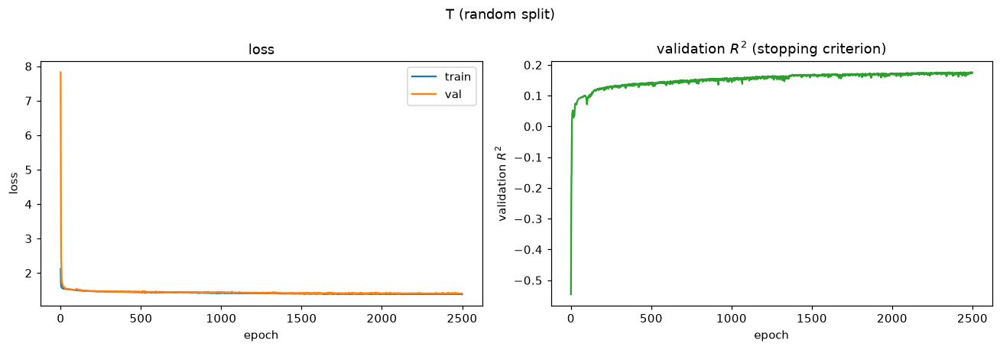

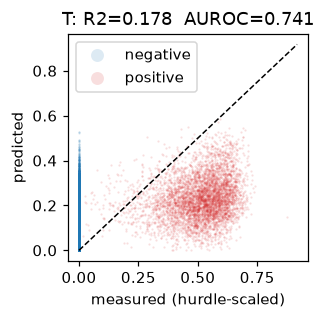

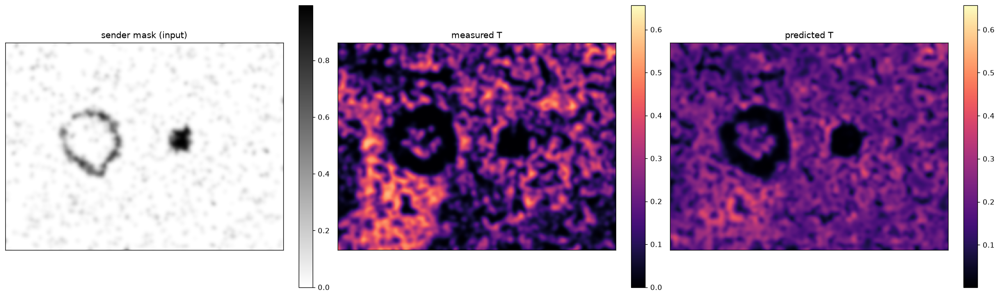

===== T blocked =====


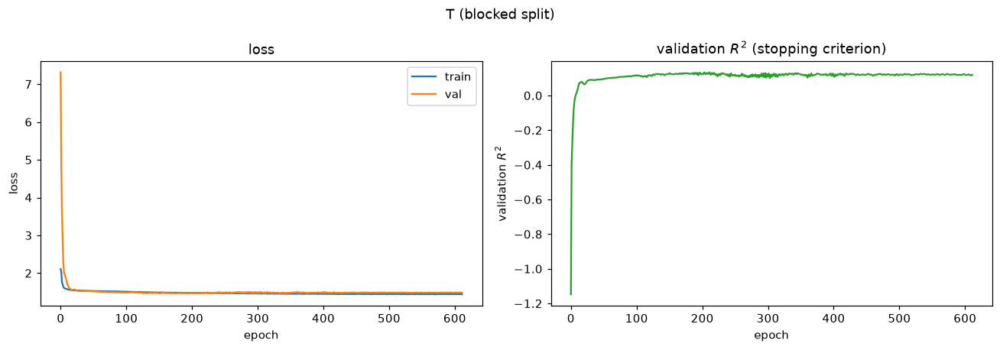

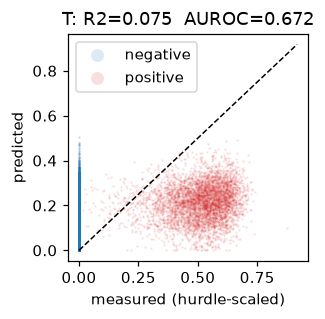

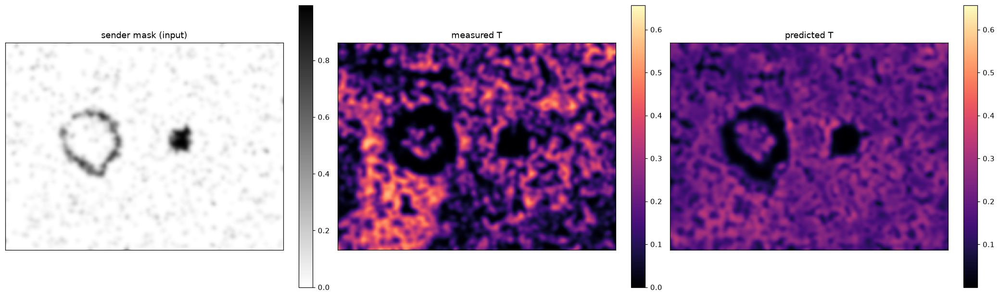

In [11]:
for marker in ['Sox17', 'T']:
    for split_style in ['random', 'blocked']:
        print('=====', marker, split_style, '=====')
        os.makedirs(f'{FIG_DIR}/{marker}_{fname}', exist_ok=True)
        os.makedirs(f'../results/models/{PRIMARY_WELL}', exist_ok=True)

        results = fitted[(marker, split_style)]
        model = results['model']
        model.save_checkpoint(f'../results/models/{PRIMARY_WELL}/{marker}_{fname}.pt')

        ax = pl.plot_training_curves(results['history'], title=f'{marker} ({split_style} split)')
        plt.tight_layout()
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_train.png')

        trm, vam, tem = MASKS[split_name]
        tem = tem.numpy()

        fig, ax = plt.subplots(figsize=(3, 3))
        pl.plot_pred_vs_actual(results['y'][tem], results['pred'][tem], results['ypos'][tem], ax=ax,
                                title=f"{marker}: R2={results['metrics']['r2']:.3f}  "
                                        f"AUROC={results['metrics'].get('auroc', float('nan')):.3f}")
        plt.tight_layout()
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_r2.png')

        pl.plot_prediction_panel(df, f'BMP4_bin', results['y'], results['pred'], target_name=marker,
                                mask_name=f'sender mask (input)', smooth_sigma=60)
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_preds.png')
        plt.tight_layout()
        plt.show()

### Predict from binary mask

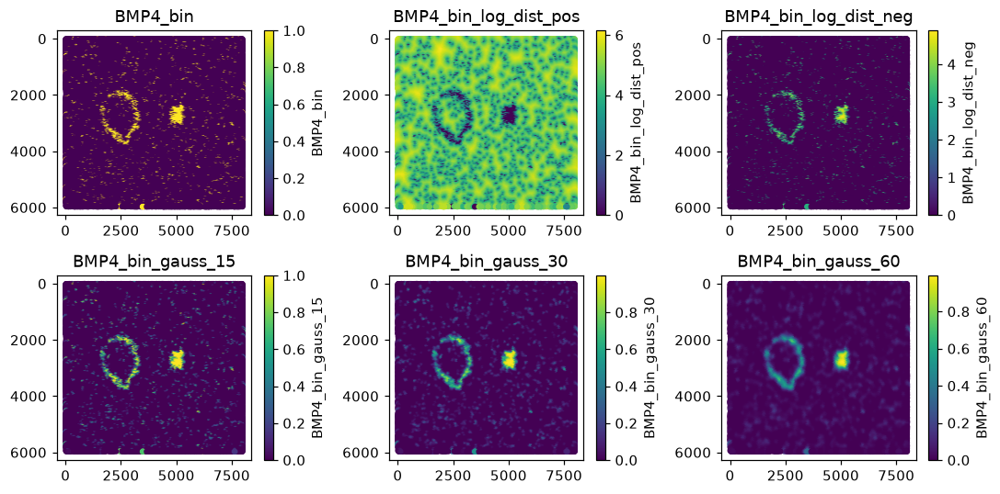

In [12]:
fname = 'BMP4_mask'
cols = X_MASK
os.makedirs(FIG_DIR, exist_ok=True)

fig, axs = plt.subplots(2, 3, figsize=(10, 5))
axs = axs.flatten()

for ax, col in zip(axs, cols):
    sc = ax.scatter(
        df['centroid_x'],
        df['centroid_y'],
        c=df[col],
        s=10,
        alpha=1,
        cmap='viridis'
    )
    ax.invert_yaxis()
    ax.set_title(col)
    fig.colorbar(sc, ax=ax, label=col)

plt.tight_layout()
plt.savefig(f'{FIG_DIR}/X_{fname}.png')

In [13]:
rows, fitted = [], {}
for marker in ['Sox17', 'T']:

    y_col = f'{marker}_mean'
    
    for split_name, (tr, va, te) in SPLITS.items():
        trm, vam, tem = MASKS[split_name]

        model, data, log_w, history = recipe.fit(
            df, cols, y_col, trm, vam, tr, 
            epochs=EPOCHS, patience=PATIENCE, verbose=False)

        pred = recipe.predict(model, data, log_w)
        y = data['y'].numpy().ravel(); ypos = data['y_positive'].numpy().ravel()
        t = tem.numpy()
        met = ev.evaluate(y[t], pred[t], ypos[t])
        rows.append(dict(target=marker, split=split_name, features=fname, **met))
        fitted[(marker, split_name)] = dict(model=model, data=data, log_w=log_w, history=history,
                                                    pred=pred, y=y, ypos=ypos, metrics=met)
        print(f'{marker:6s} {split_name:8s} {fname:24s} '
                f'R2={met["r2"]:+.4f}  AUROC={met.get("auroc", float("nan")):.3f}')

results = pd.DataFrame(rows)
results.to_csv(f'{FIG_DIR}/models_{fname}.csv')
results.round(4)

Sox17  random   BMP4_mask                R2=+0.1657  AUROC=0.768
Sox17  blocked  BMP4_mask                R2=+0.0854  AUROC=0.740
T      random   BMP4_mask                R2=+0.1798  AUROC=0.744
T      blocked  BMP4_mask                R2=+0.1005  AUROC=0.695


,target,split,features,r2,pearson,spearman,auroc,ap,base_rate,r2_positives
0,Sox17,random,BMP4_mask,0.1657,0.4071,0.3621,0.7684,0.4261,0.1754,-3.5136
1,Sox17,blocked,BMP4_mask,0.0854,0.3097,0.3065,0.7398,0.3126,0.1564,-3.6099
2,T,random,BMP4_mask,0.1798,0.4244,0.4210,0.7443,0.6001,0.3629,-5.7102
3,T,blocked,BMP4_mask,0.1005,0.3290,0.3217,0.6948,0.4806,0.3265,-6.6448


===== Sox17 random =====


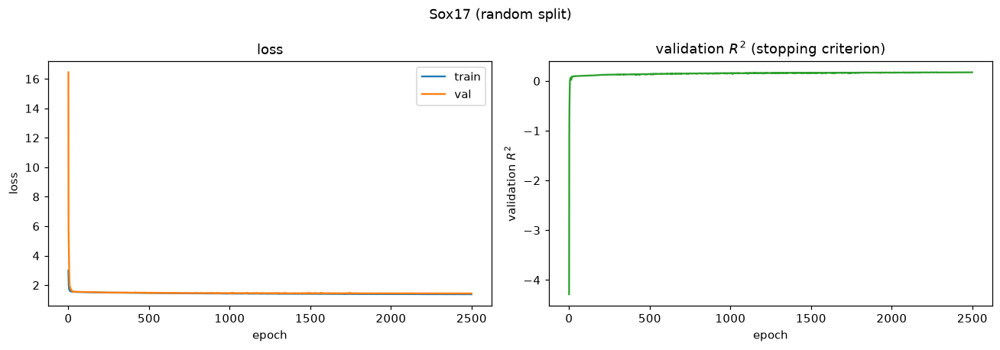

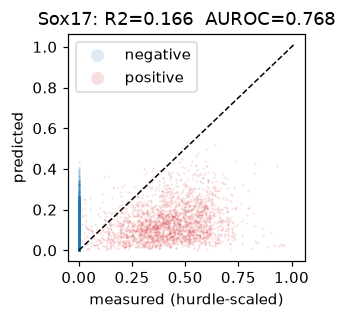

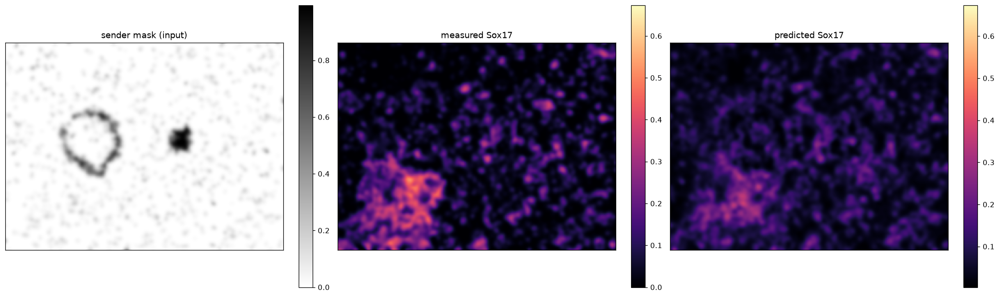

===== Sox17 blocked =====


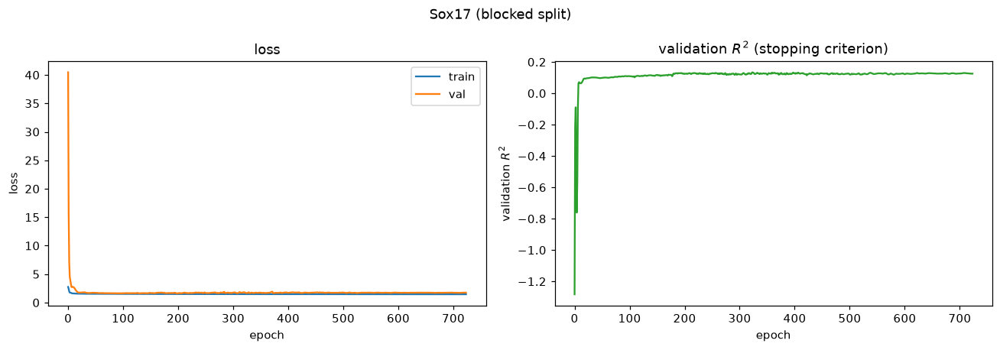

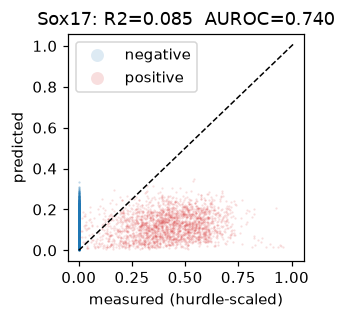

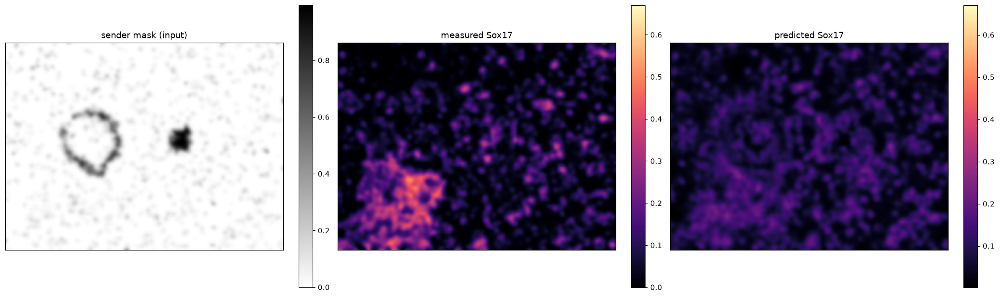

===== T random =====


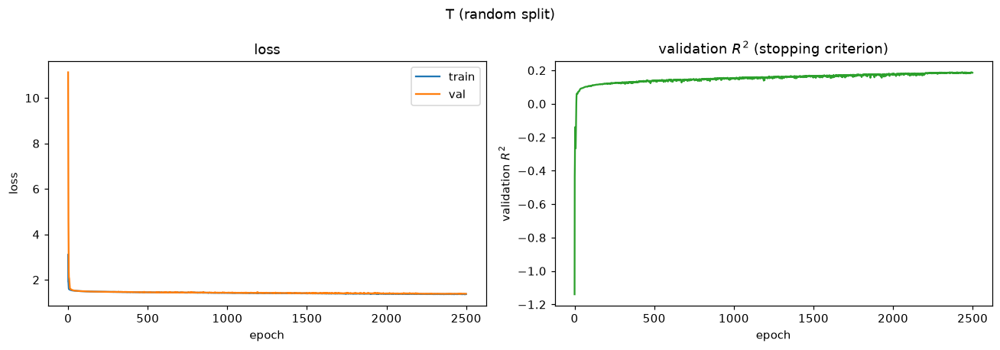

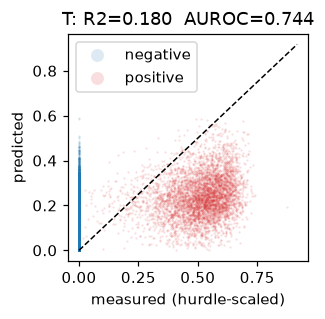

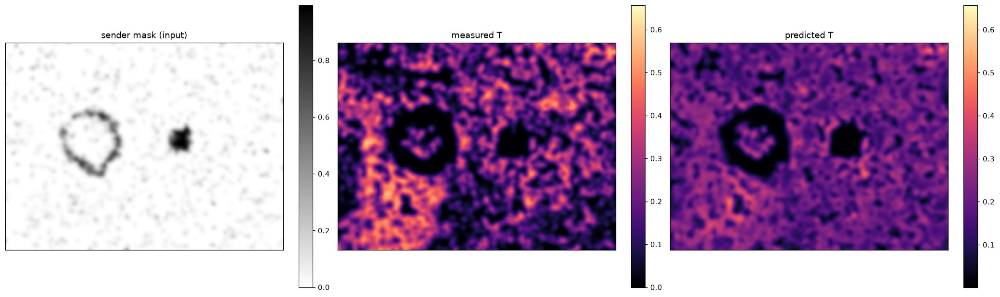

===== T blocked =====


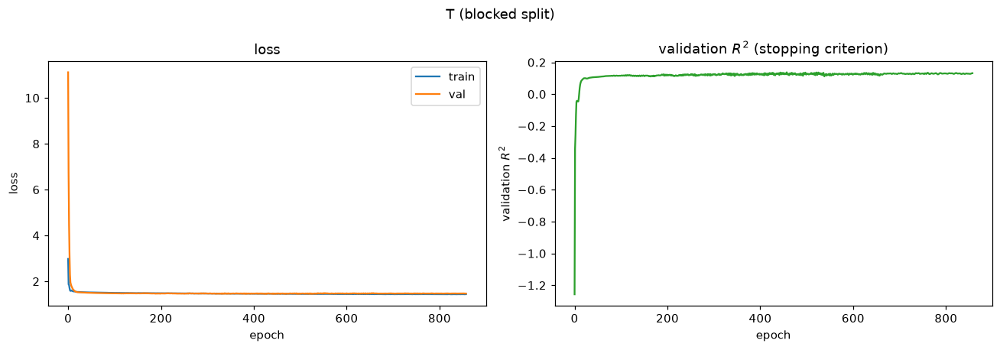

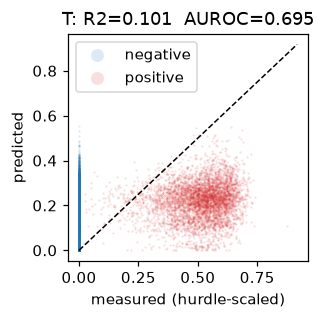

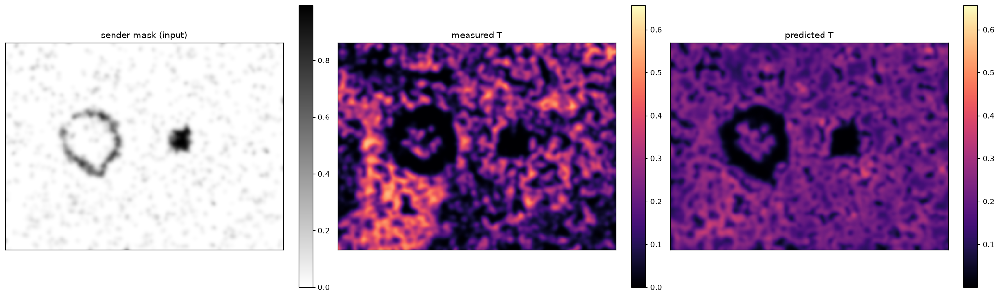

In [14]:
for marker in ['Sox17', 'T']:
    for split_style in ['random', 'blocked']:
        print('=====', marker, split_style, '=====')
        os.makedirs(f'{FIG_DIR}/{marker}_{fname}', exist_ok=True)
        os.makedirs(f'../results/models/{PRIMARY_WELL}', exist_ok=True)

        results = fitted[(marker, split_style)]
        model = results['model']
        model.save_checkpoint(f'../results/models/{PRIMARY_WELL}/{marker}_{fname}.pt')

        ax = pl.plot_training_curves(results['history'], title=f'{marker} ({split_style} split)')
        plt.tight_layout()
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_train.png')

        trm, vam, tem = MASKS[split_name]
        tem = tem.numpy()

        fig, ax = plt.subplots(figsize=(3, 3))
        pl.plot_pred_vs_actual(results['y'][tem], results['pred'][tem], results['ypos'][tem], ax=ax,
                                title=f"{marker}: R2={results['metrics']['r2']:.3f}  "
                                        f"AUROC={results['metrics'].get('auroc', float('nan')):.3f}")
        plt.tight_layout()
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_r2.png')

        pl.plot_prediction_panel(df, f'BMP4_bin', results['y'], results['pred'], target_name=marker,
                                mask_name=f'sender mask (input)', smooth_sigma=60)
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_preds.png')
        plt.tight_layout()
        plt.show()

### Evaluate on separate well 

In [15]:
EVAL_WELL = 'W8_pattern1_Sox17_Brachyury'
df = load_well(EVAL_WELL)

IF_BACKGROUNDS = df[['Sox17_mean', 'T_mean', 'BMP4_mean']].mean().to_dict()
BACKGROUNDS = recipe.normalize(df, ['BMP4_mean', 'Sox17_mean', 'T_mean'], backgrounds=IF_BACKGROUNDS)
centroids = df[['centroid_y', 'centroid_x']].to_numpy(np.float32)
X_MASK = recipe.mask_features(df, 'BMP4_bin', max_sigma=recipe.MAX_SIGMA, geometry=True)
X_INTENSITY = recipe.intensity_features(df, 'BMP4_mean', max_sigma=recipe.MAX_SIGMA)

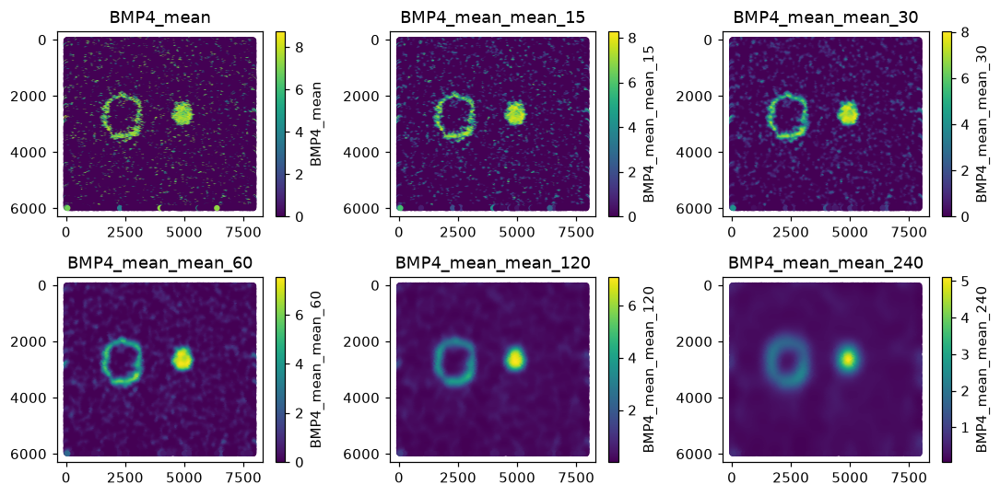

In [16]:
fname = 'BMP4_intensities'
cols = X_INTENSITY

fig, axs = plt.subplots(2, 3, figsize=(10, 5))
axs = axs.flatten()

for ax, col in zip(axs, cols):
    sc = ax.scatter(
        df['centroid_x'],
        df['centroid_y'],
        c=df[col],
        s=10,
        alpha=1,
        cmap='viridis'
    )
    ax.invert_yaxis()
    ax.set_title(col)
    fig.colorbar(sc, ax=ax, label=col)

plt.tight_layout()

In [17]:
from models.predictors import IFPredictor
from models.recipe import build_data

rows, fitted = [], {}
for marker in ['Sox17', 'T']:

    y_col = f'{marker}_mean'
    
    for split_name in SPLITS.keys():

        model = IFPredictor.load_checkpoint(f'../results/models/{PRIMARY_WELL}/{marker}_{fname}.pt', device='mps')
        data = build_data(df, cols, y_col)
        n_pos = data['y_positive'].sum()
        log_w = ((data['y_positive'].shape[0] - n_pos) / n_pos).clamp(min=1.0)

        pred = recipe.predict(model, data, log_w)
        y = data['y'].numpy().ravel(); ypos = data['y_positive'].numpy().ravel()
        met = ev.evaluate(y, pred, ypos)
        rows.append(dict(target=marker, split=split_name, features=fname, **met))
        fitted[(marker, split_name)] = dict(model=model, data=data, log_w=log_w, 
                                                    pred=pred, y=y, ypos=ypos, metrics=met)
        print(f'{marker:6s} {split_name:8s} {fname:24s} '
                f'R2={met["r2"]:+.4f}  AUROC={met.get("auroc", float("nan")):.3f}')

results = pd.DataFrame(rows)
results.to_csv(f'{FIG_DIR}/models_{fname}_{EVAL_WELL}.csv')
results.round(4)

Sox17  random   BMP4_intensities         R2=-0.1347  AUROC=0.625
Sox17  blocked  BMP4_intensities         R2=-0.1347  AUROC=0.625
T      random   BMP4_intensities         R2=-0.0397  AUROC=0.703
T      blocked  BMP4_intensities         R2=-0.0397  AUROC=0.703


,target,split,features,r2,pearson,spearman,auroc,ap,base_rate,r2_positives
0,Sox17,random,BMP4_intensities,-0.1347,0.1948,0.1659,0.6248,0.2422,0.1552,-5.0830
1,Sox17,blocked,BMP4_intensities,-0.1347,0.1948,0.1659,0.6248,0.2422,0.1552,-5.0830
2,T,random,BMP4_intensities,-0.0397,0.3123,0.3271,0.7026,0.4772,0.3160,-11.2724
3,T,blocked,BMP4_intensities,-0.0397,0.3123,0.3271,0.7026,0.4772,0.3160,-11.2724


===== Sox17 random =====


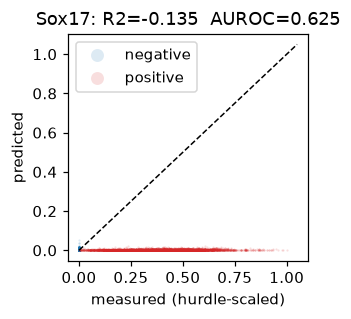

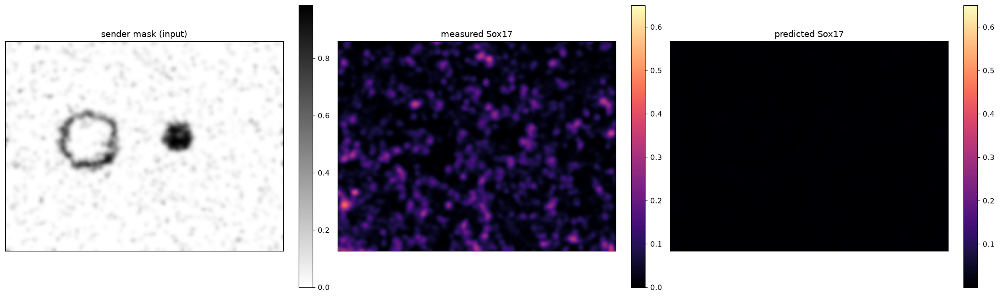

===== Sox17 blocked =====


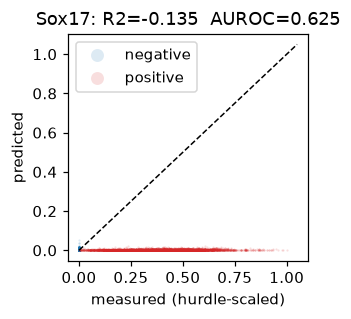

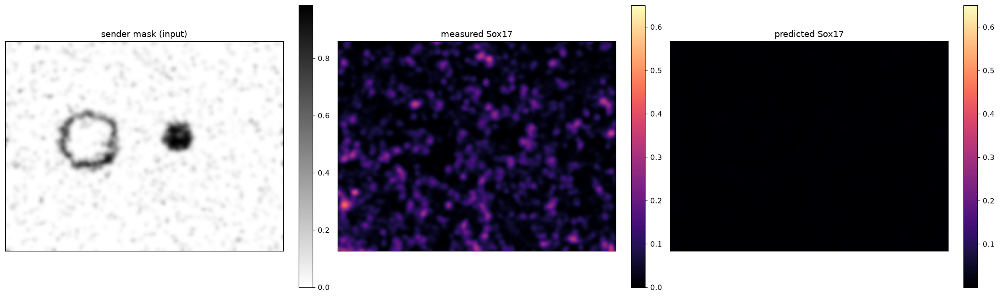

===== T random =====


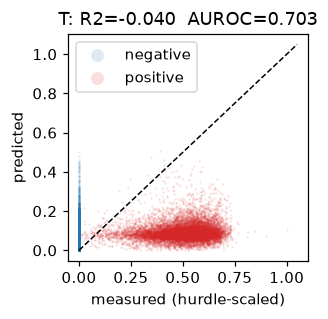

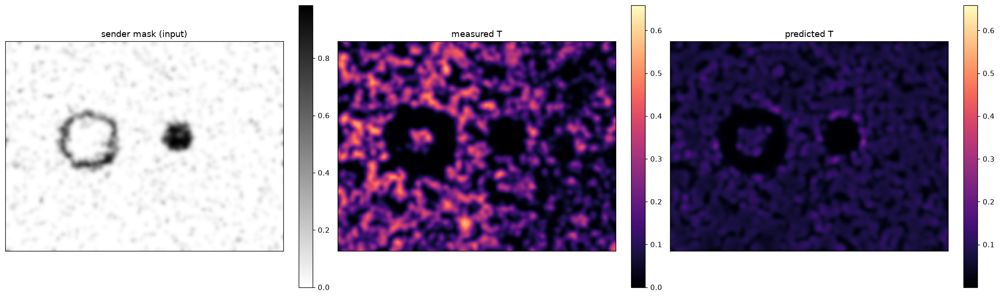

===== T blocked =====


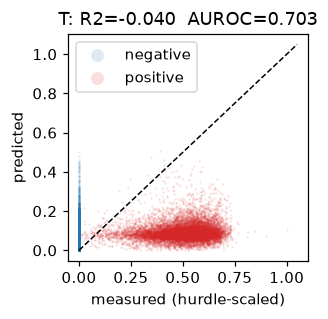

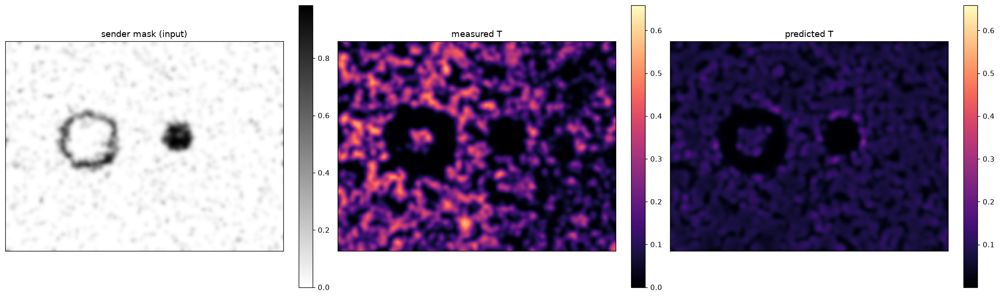

In [18]:
for marker in ['Sox17', 'T']:
    for split_style in ['random', 'blocked']:
        print('=====', marker, split_style, '=====')

        results = fitted[(marker, split_style)]

        fig, ax = plt.subplots(figsize=(3, 3))
        pl.plot_pred_vs_actual(results['y'], results['pred'], results['ypos'], ax=ax,
                                title=f"{marker}: R2={results['metrics']['r2']:.3f}  "
                                        f"AUROC={results['metrics'].get('auroc', float('nan')):.3f}")
        plt.tight_layout()
        plt.savefig(f'{FIG_DIR}//{marker}_{fname}/{split_style}_r2_{EVAL_WELL}.png')

        pl.plot_prediction_panel(df, f'BMP4_bin', results['y'], results['pred'], target_name=marker,
                                mask_name=f'sender mask (input)', smooth_sigma=60)
        plt.savefig(f'{FIG_DIR}/{marker}_{fname}/{split_style}_preds_{EVAL_WELL}.png')
        plt.tight_layout()
        plt.show()